# <center>LOGISTIC REGRESSION CLASSIFIER</center>

***
## <font color = blue>I. DATA PREPARATION</font>
> A. LIBRARIES<br>
> B. COLLECTING DATA<br>
> C. SPLIT BETWEEN TRAINING SET AND TEST SET<br>
> D. DATA PREPARATION WITH PREPROCESSING<br>
## <font color = blue>II. LOGISTIC REGRESSION MODEL</font>
> A. CREATION OF LOGISTIC REGRESSION MODEL<br>
> B. CONFUSION MATRIX<br>
> C. CLASSIFICATION REPORT<br>
> D. WRONG PREDICTIONS<br>

## <font color = blue>III. OVERSAMPLING</font>
> A. RESAMPLING WITH RAMDOMOVERSAMPLER<br>
> B. CONFUSION MATRIX<br>
> C. CLASSIFICATION REPORT<br>
> D. WRONG PREDICTIONS<br>

## <font color = blue>I. DATA PREPARATION</font>
> A. LIBRARIES<br>

In [ ]:
pip install pytesseract

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 3.2 MB 13.7 MB/s 
  Attempting uninstall: Pillow
    Found existing installation: Pillow 7.1.2
    Uninstalling Pillow-7.1.2:
      Successfully uninstalled Pillow-7.1.2


In [2]:
import numpy as np
import pandas as pd
import cv2 as cva
import matplotlib.pyplot as plt
from sklearn.naive_bayes import MultinomialNB
from sklearn.pipeline import Pipeline
from sklearn import ensemble
from sklearn import linear_model
from sklearn.pipeline import Pipeline
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import AdaBoostClassifier
import matplotlib.pyplot as plt

from sklearn.feature_extraction.text import CountVectorizer,TfidfTransformer,TfidfVectorizer
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
%matplotlib inline
import sklearn.metrics as metrics
import itertools
from sklearn.metrics import classification_report
import os
from sklearn.metrics import confusion_matrix
from imblearn.over_sampling import RandomOverSampler
from helpers import load_image, show_wrong_predictions, confusion_matrix, global_classification_report,show_wrong_prediction,read_image, printmd


In [1]:
import cv2
from IPython.display import Markdown, display
from mpl_toolkits.axes_grid1 import ImageGrid
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from sklearn import metrics
import itertools
from sklearn.metrics import classification_report
import os.path


> B. COLLECTING DATA<br>

In [3]:
df = pd.read_csv('../data/data.csv')

In [4]:
df.head()#Get the 5 first rows

,Unnamed: 0.1,Unnamed: 0,filename,url,description,type,filepath,scraped,old_filename,old_filepath,...,text_ocr,words_count,text_en,text_fr,text_fr_norm,text_en_norm,target_en,target_fr,target,target_min
0,0,0,img_0000000.jpg,https://templates.invoicehome.com/modele-factu...,100 modèles gratuits de factures | Téléchargem...,facture,./final/img_0000000.jpg,1,img_0000000.jpg,./facture/img_0000000.jpg,...,FACTURE LOGO Joanna Binet 48 Coubertin 31400 ...,98,Invoice Logo Joanna Binet Coubertin Paris Invo...,Facture Logo Joanna Binet Coubertin Paris F...,facture logo joanna binet coubertin paris fact...,invoice logo joanna binet coubertin paris invo...,invoice,facture,invoice,invoice
1,1,1,img_0000001.jpg,https://templates.invoicehome.com/modele-factu...,100 modèles gratuits de factures | Téléchargem...,facture,./final/img_0000001.jpg,1,img_0000001.jpg,./facture/img_0000001.jpg,...,Joanna Binet 48 Coubertin 31400 Paris FACTURE...,97,Joanna Binet Coubertin Paris Invoice Invoice i...,Joanna Binet Coubertin Paris Facture Factur...,joanna binet coubertin paris facture facturé c...,joanna binet coubertin paris invoice invoice c...,invoice,facture,invoice,invoice
2,2,2,img_0000002.jpg,https://www.coover.fr/wp-content/uploads/2021/...,Facture proforma : modèle à télécharger gratui...,facture,./final/img_0000002.jpg,1,img_0000002.jpg,./facture/img_0000002.jpg,...,FACTURE Mon entreprise : Nom de la société Ad...,45,Invoice My company : Company name Mail address...,Facture Mon entreprise : Nom de la société Ad...,facture entreprise société adresse postale adr...,invoice company company name mail address tele...,invoice,facture,invoice,invoice
3,3,3,img_0000003.jpg,https://templates.invoicehome.com/modele-factu...,100 modèles gratuits de factures | Téléchargem...,facture,./final/img_0000003.jpg,1,img_0000003.jpg,./facture/img_0000003.jpg,...,Joanna Binet 48 Coubertin 31400 Paris FACTURE...,99,Joanna Binet Coubertin Paris Bill To Cinderell...,Joanna Binet Coubertin Paris Facture À Cend...,joanna binet coubertin paris facture cendrillo...,joanna binet coubertin paris bill cinderella a...,invoice,facture,invoice,invoice
4,4,4,img_0000004.jpg,https://files.intum.com/v/vosfactures/files/31...,Base de Connaissances - Vos Factures - Créer u...,facture,./final/img_0000004.jpg,1,img_0000004.jpg,./facture/img_0000004.jpg,...,Payer en ligne > FACTURE No SFIDELI F/05.2020...,157,Pay online Invoice No Sfideli F/ Creation date...,Payer en ligne Facture No Sfideli F/ Date de...,payer ligne facture sfideli date création date...,online invoice sfideli creation date validity ...,invoice,facture,invoice,invoice


In order to improve the performance, we will group some classes 

In [5]:
# Replace current classes by new classes i.e by grouping certain classes together
def replace_target(df):
    new_classes =  { 'advertisement': 'other_types',
                    'form'        : 'other_types',
                   'handwritten' : 'other_types',
                   'letter' : 'other_types',
                    'memo': 'other_types',
                    'presentation': 'other_types',
                   'invoice' :'facture',
                   'news_article': 'scientific_doc',
                   'scientific_publication': 'scientific_doc',
                   'scientific_report': 'scientific_doc'}

    df = df.replace(new_classes)
    # Creating dictionary
    dico_type = {'facture': 0,
                 'id_pieces': 1,
                 'justif_domicile': 2,
                 'passeport': 3,
                 'paye': 4,
                 'carte postale': 5,
                 'other_types': 6,
                 'scientific_doc': 7,
                 'resume': 8,
                 'specification': 9,
                 'budget': 10,
                 'file_folder': 11,
                 'email': 12,
                 'questionnaire': 13}

    # Creating revert dictionary
    dico_type_inv = {v: k for k, v in dico_type.items()}

    # Convert types according to the dictionary
    df['type_num'] = df.type.replace(dico_type)
    df.head()

 C. SPLIT BETWEEN TRAINING SET AND TEST SET<br>

In [6]:
df=df.dropna(subset=['text_en_norm'])

X = df['text_en_norm']# text is the feature
y = df['target_min']# type is the target
X_text_train,X_text_test,y_train,y_test = train_test_split(X,y,test_size=0.2, random_state=1234)# Assign 20% of the dataset records to the test set

## <font color = blue>II. LOGISTIC REGRESSION MODEL</font>
> A. CREATION OF LOGISTIC REGRESSION MODEL<br>

 First, we need to have numeric feature vectors to be able to apply the algorithm.

In [7]:
tfid = TfidfVectorizer()# Initialization of a vectorizer with TfidfVectorizer method

X_train = tfid.fit_transform(X_text_train)# Fit then transform X_train
X_test = tfid.transform(X_text_test)# Transform X_test

pd.DataFrame(X_train).head()#Get the 5 first rows of X_train

,0
0,"(0, 19847)\t0.4645488034897779\n (0, 2979)\..."
1,"(0, 8331)\t0.1577574558588645\n (0, 14575)\..."
2,"(0, 7948)\t0.0539891712592131\n (0, 567)\t0..."
3,"(0, 7639)\t0.3806806997211806\n (0, 16175)\..."
4,"(0, 7036)\t0.055910235604074446\n (0, 2080)..."


Now,let't evaluate the classifiction model

In [8]:
clf = linear_model.LogisticRegression(C=1.0)# Creation of clf classifier
clf.fit(X_train, y_train)# Train the model

y_pred=clf.predict(X_test)# Prediction on the test set 


> B. CONFUSION MATRIX<br>

In [9]:
def confusion_matrix(y_test, y_pred,classes=[]):
    cnf_matrix = metrics.confusion_matrix(y_test, y_pred)
    if (len(classes)==0):
        extract_classes = pd.DataFrame(data = y_test.unique(), columns = ['classe']).sort_values(by = 'classe', ascending = True)
        classes = extract_classes.classe #range(0,21)

    plt.figure(figsize = (12, 12))

    plt.imshow(cnf_matrix, interpolation = 'nearest', cmap = 'Blues')
    plt.title("Confusion matrix")
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation = 90)
    plt.yticks(tick_marks, classes)

    for i, j in itertools.product(range(cnf_matrix.shape[0]), range(cnf_matrix.shape[1])):
        plt.text(j, i, cnf_matrix[i, j],
                 horizontalalignment = "center",
                 color = "white" if cnf_matrix[i, j] > ( cnf_matrix.max() / 2) else "black")

    plt.ylabel('True labels')
    plt.xlabel('Labels predicted')
    plt.show()

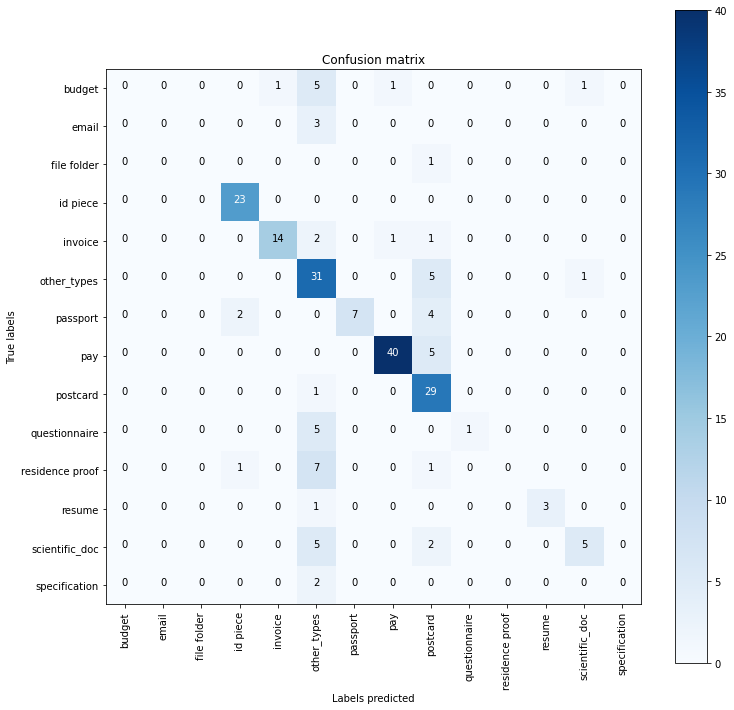

In [10]:
confusion_matrix(y_test,y_pred)

> C. CLASSIFICATION REPORT<br>

In [11]:
# Class predictions per type of document (passport, questionnaire, etc...)
def global_classification_report(y_test, y_pred,classifier="None",category="None"):    
    append = False
    if(os.path.exists('../data/classification_report.csv')):
        df = pd.read_csv('../data/classification_report.csv')
        append = True
  
    report = classification_report(y_test, y_pred, output_dict=True)
    df_report = pd.DataFrame(report).transpose().reset_index() 
    df_report['classifier'] = classifier
    df_report['category'] = category    
    
    if (append):
        df = df.drop(df[(df['classifier']==classifier) & (df['category']==category)].index)
        df = pd.concat([df, df_report])
    else:
        df = df_report
        
    df.to_csv('../data/classification_report.csv',index=False)
print(classification_report(y_test, y_pred))

                 precision    recall  f1-score   support

         budget       0.00      0.00      0.00         8
          email       0.00      0.00      0.00         3
    file folder       0.00      0.00      0.00         1
       id piece       0.88      1.00      0.94        23
        invoice       0.93      0.78      0.85        18
    other_types       0.50      0.84      0.63        37
       passport       1.00      0.54      0.70        13
            pay       0.95      0.89      0.92        45
       postcard       0.60      0.97      0.74        30
  questionnaire       1.00      0.17      0.29         6
residence proof       0.00      0.00      0.00         9
         resume       1.00      0.75      0.86         4
 scientific_doc       0.71      0.42      0.53        12
  specification       0.00      0.00      0.00         2

       accuracy                           0.73       211
      macro avg       0.54      0.45      0.46       211
   weighted avg       0.70   

C:\anaconda\lib\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\anaconda\lib\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\anaconda\lib\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


> D. WRONG PREDICTIONS<br>

In [12]:
%%javascript
 IPython.OutputArea.prototype._should_scroll = function(lines) {
     return false;
 }

<IPython.core.display.Javascript object>

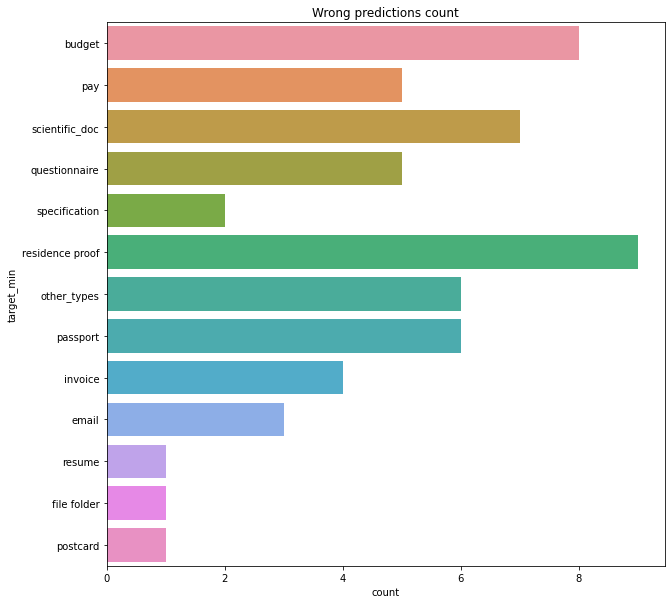

## Wrong predictions for residence proof

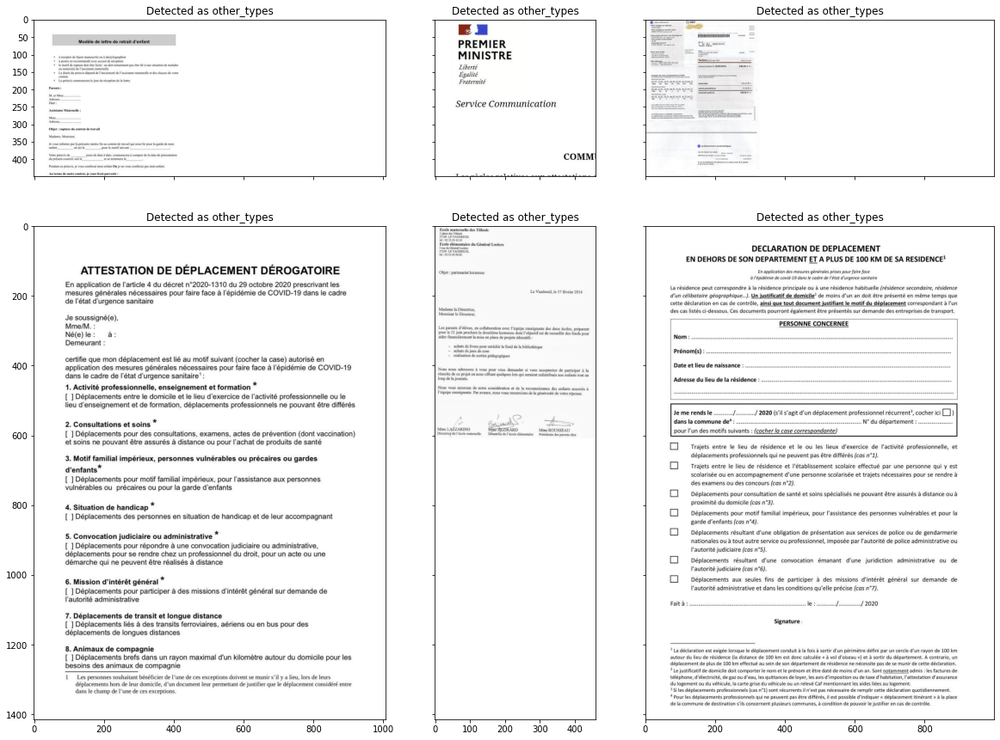

## Wrong predictions for budget

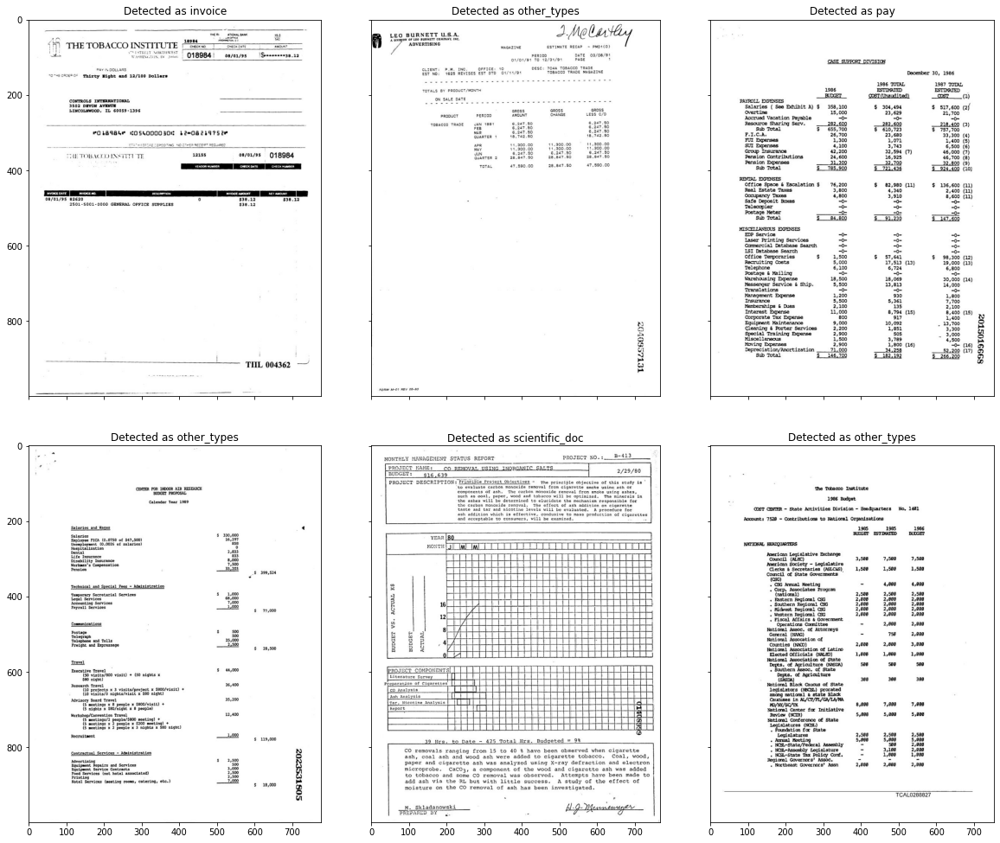

## Wrong predictions for scientific_doc

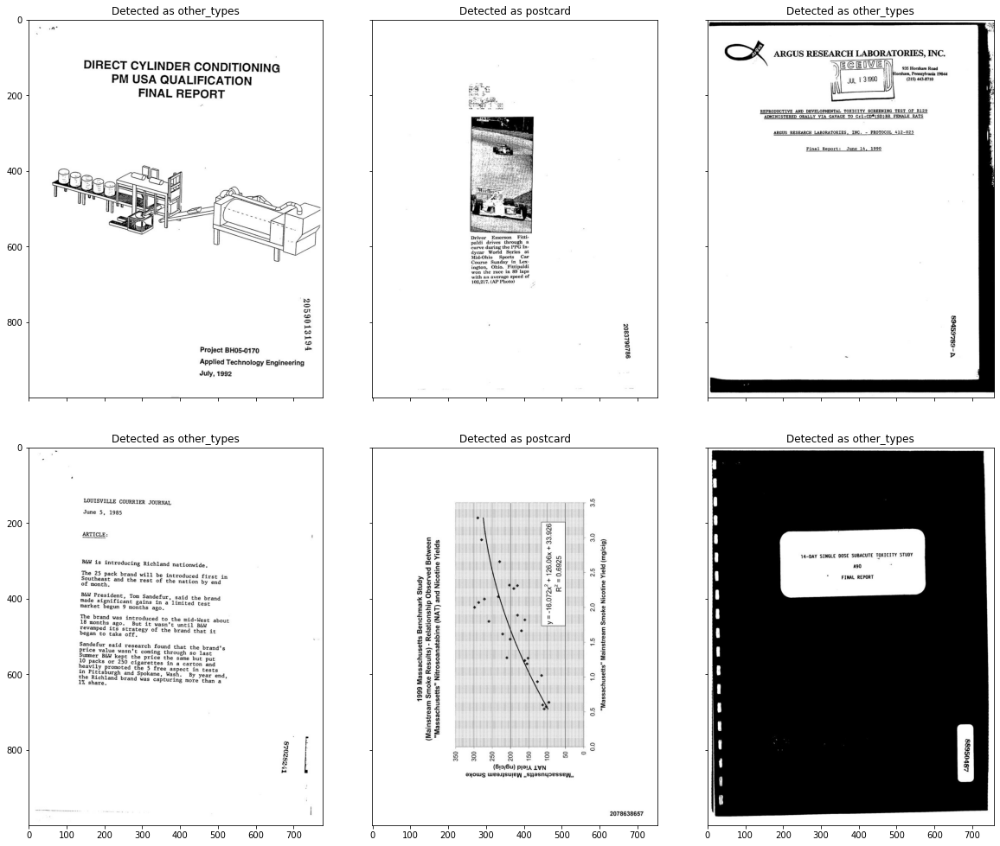

## Wrong predictions for other_types

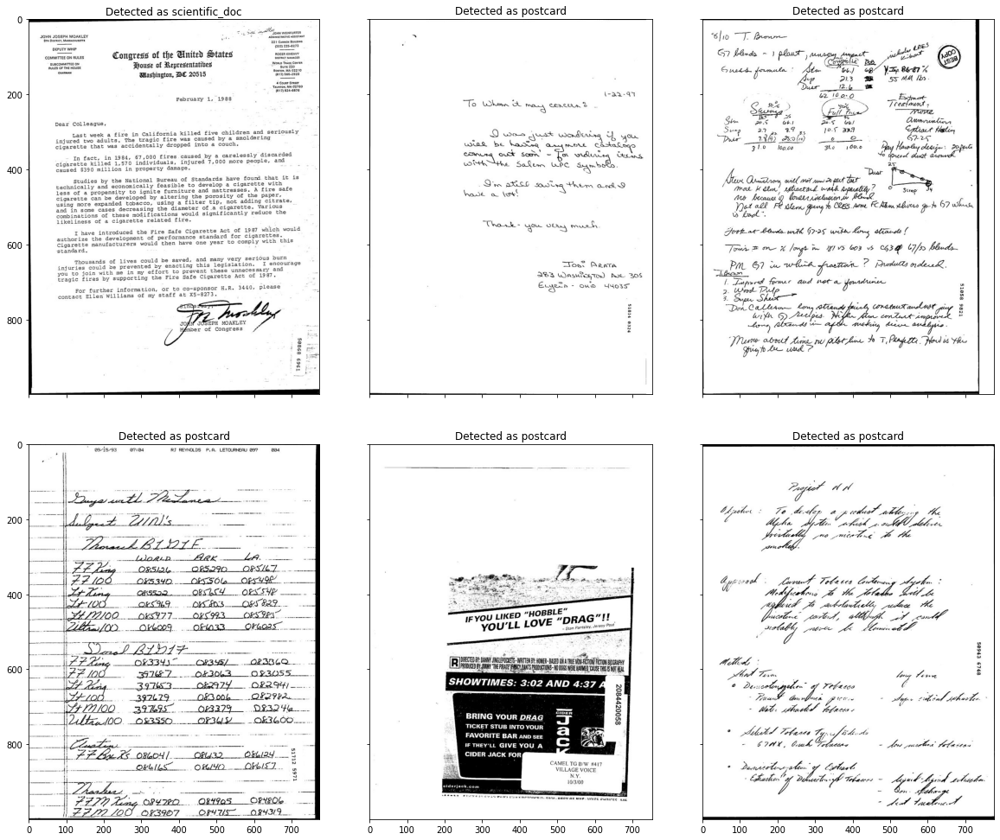

## Wrong predictions for passport

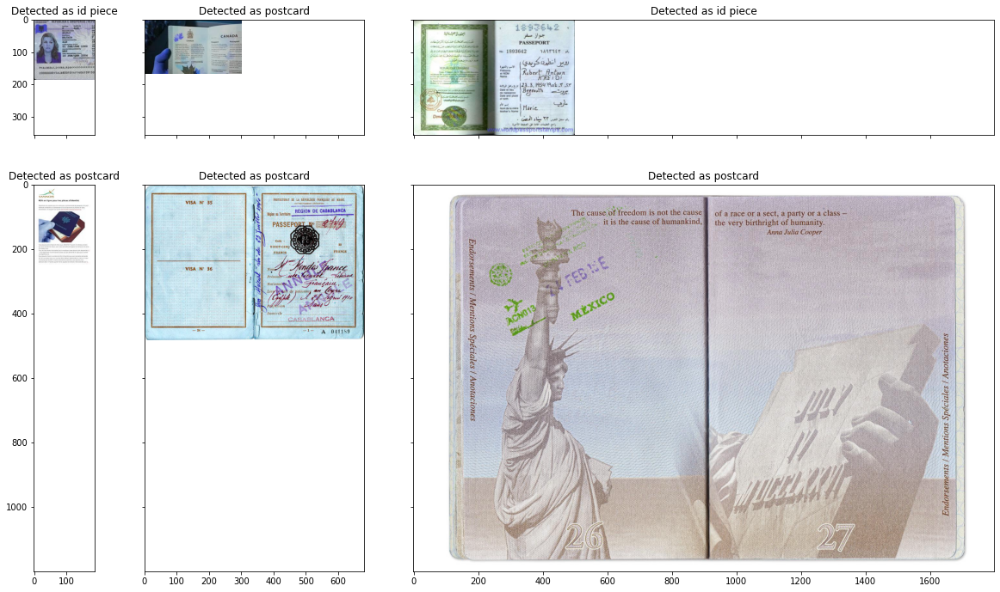

## Wrong predictions for pay

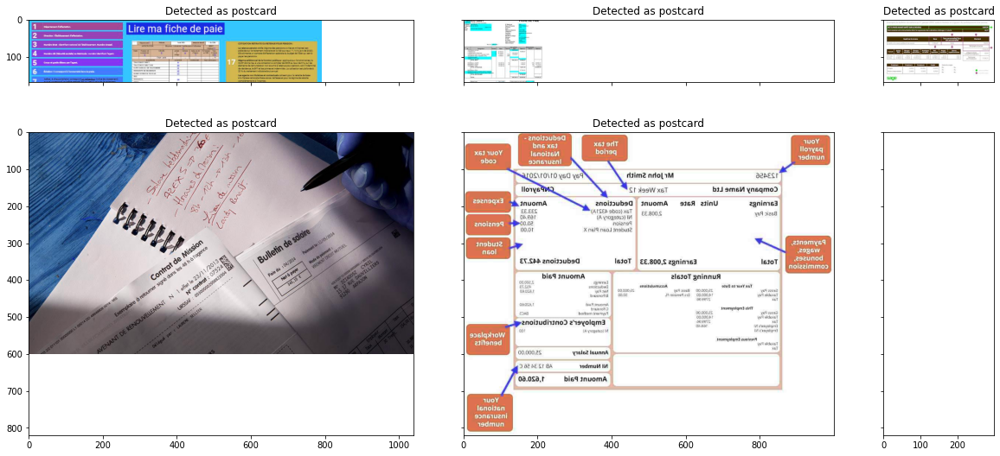

## Wrong predictions for questionnaire

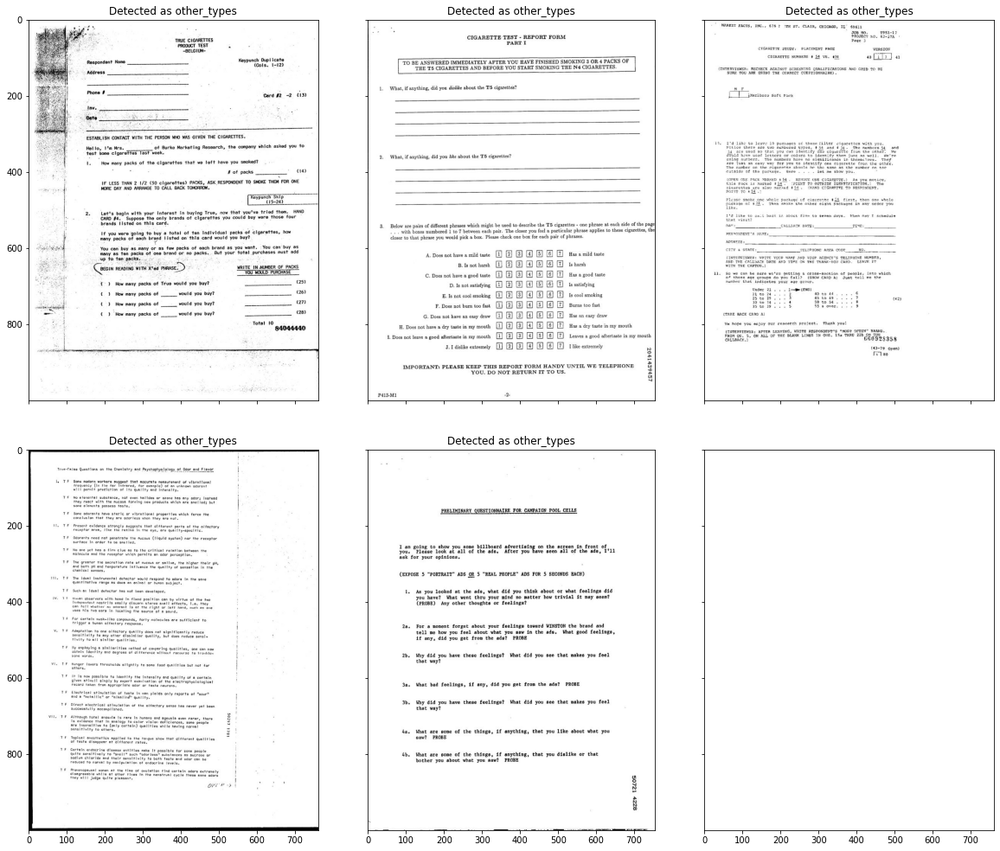

## Wrong predictions for invoice

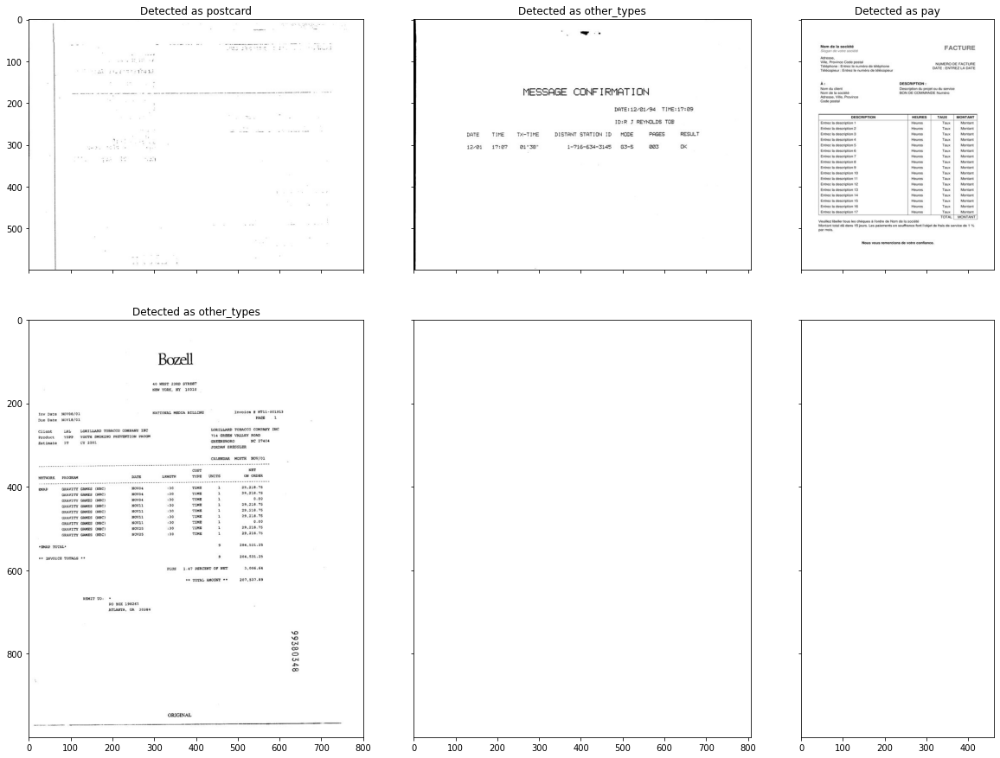

## Wrong predictions for email

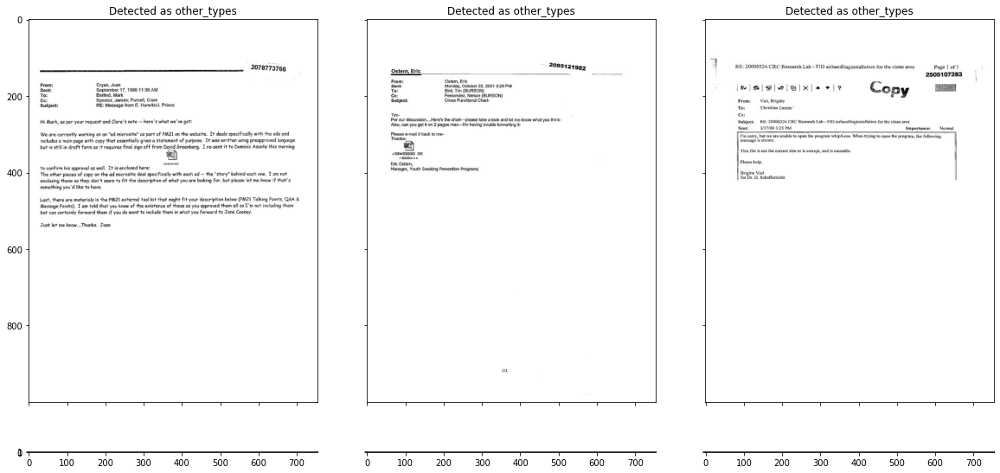

## Wrong predictions for specification

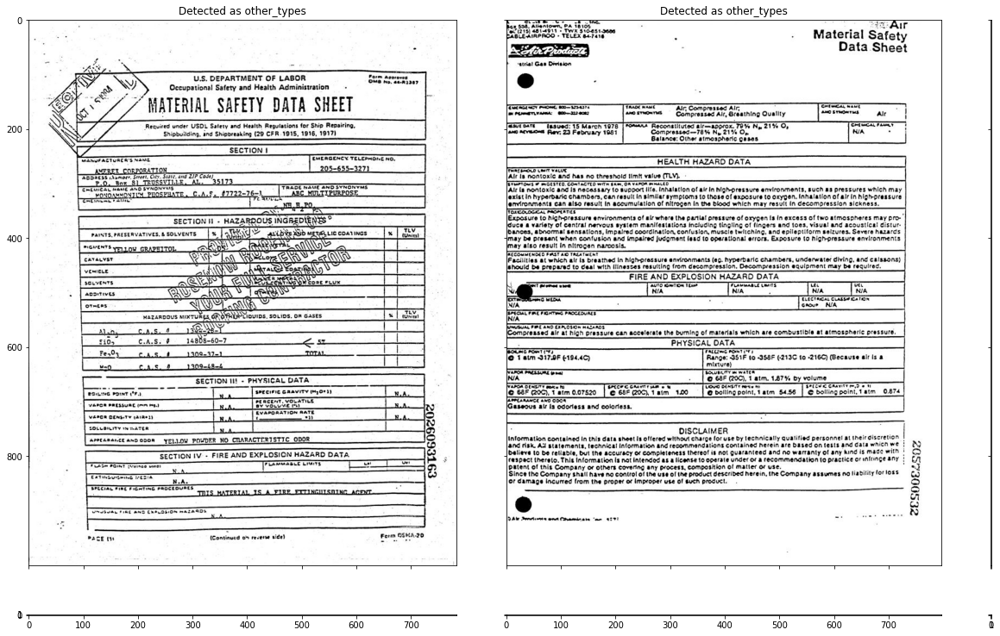

## Wrong predictions for resume

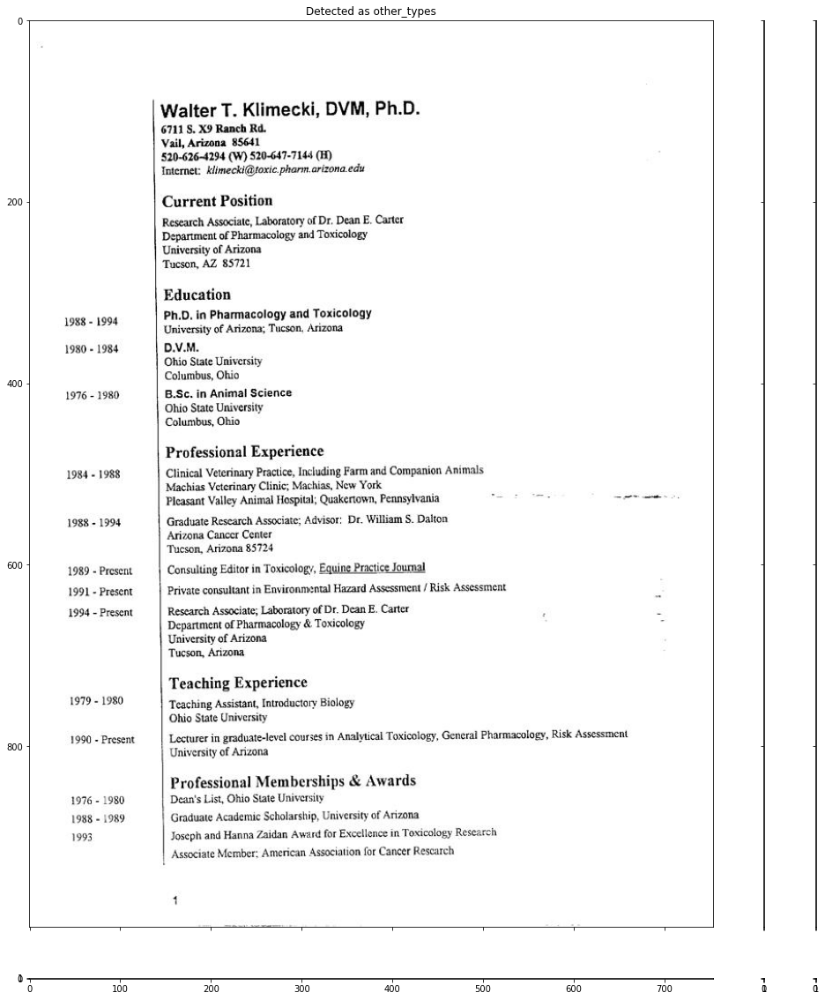

## Wrong predictions for file folder

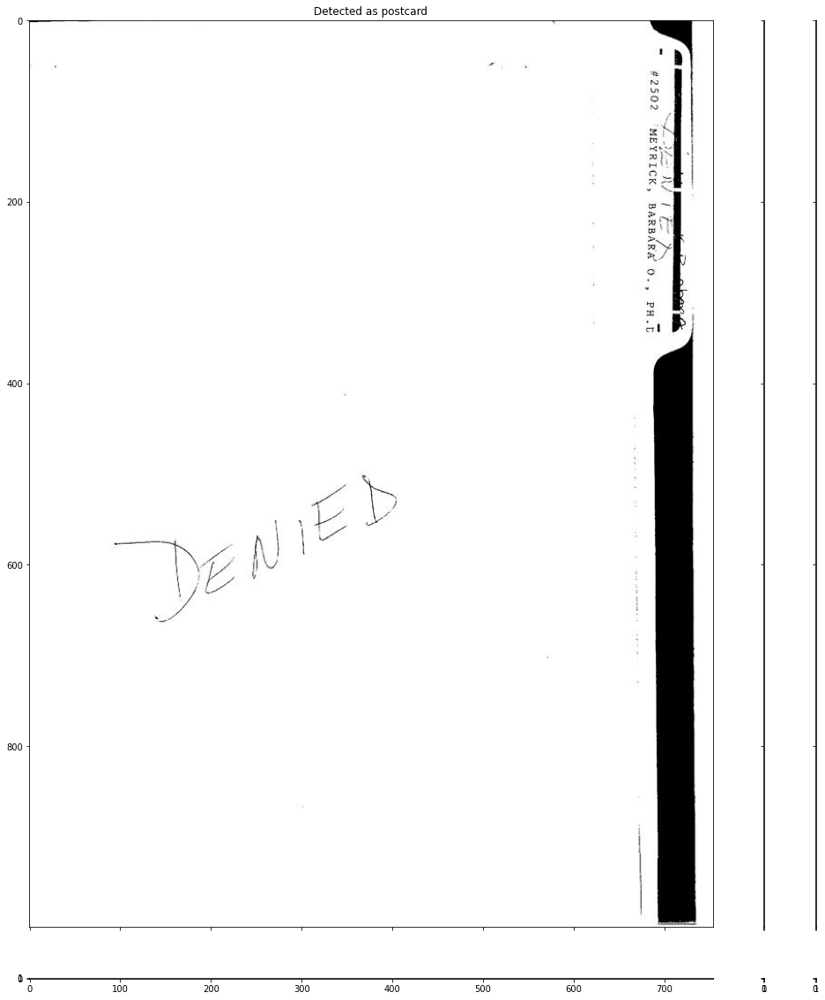

## Wrong predictions for postcard

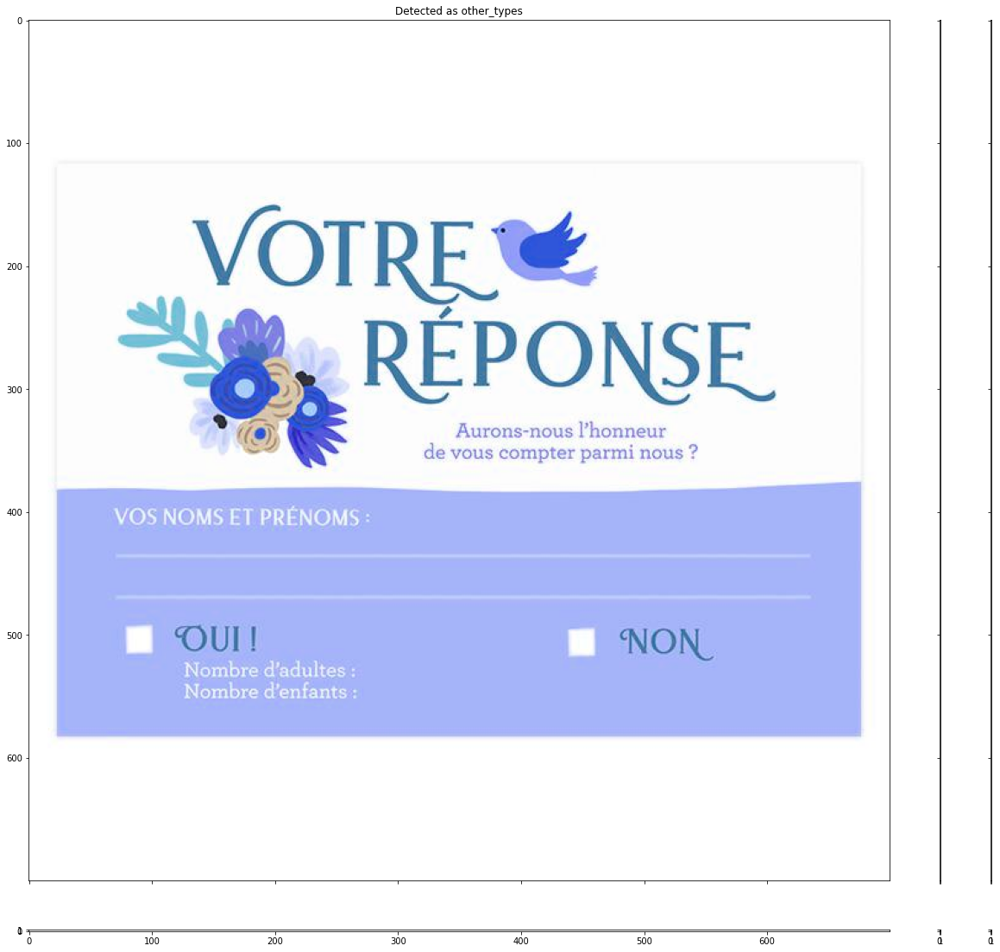

In [13]:
# Check wrong predictions per type
def show_wrong_prediction(df,target): 
    fig = plt.figure(figsize=(20., 20.))
    
    grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(2, 3),  # creates 2x2 grid of axes
                 axes_pad=0.8,  # pad between axes in inch.
                 aspect = True
                 )
    printmd('## Wrong predictions for ' + df.iloc[0,:][target])
    for ax,(index,row) in zip(grid,df.iterrows()):
        ax.imshow(read_image(row['filename']))
        ax.set_title('Detected as ' + row['pred'])
        ax.grid(False)
    plt.show()  

def show_wrong_predictions(df,y_test,y_pred,X_test,target='type'):   
    
    X_result = df.loc[X_test.index,:][['filename', target]].copy()
    X_result['real'] = y_test
    X_result['pred'] = y_pred
    X_bad = X_result[X_result['pred']!=X_result['real']]
    
    fig = plt.figure(figsize=(10,10))
    sns.countplot(y=target,data=X_bad)
    plt.title('Wrong predictions count')
    plt.show()
    
    
    vc = pd.DataFrame(X_bad[target].value_counts()).head(20)
    for t in vc.index.tolist():
        show_wrong_prediction(X_bad[X_bad['target_min']==t],target)
show_wrong_predictions(df,y_test,y_pred,X_text_test,target='target_min')

### <font color = blue>III. OVERSAMPLING</font>
> A. RESAMPLING WITH RAMDOMOVERSAMPLER<br>


As some classes are under-represented,we will use the function RamdomOverSampler to generate new samples by randomly sampling with replacement the current available samples.

In [14]:
X = df['text_en_norm']# text is the feature
y = df['target_min']# type is the target
X_text_train,X_text_test,y_train,y_test = train_test_split(X,y,test_size=0.2, random_state=1234)# Assign 20% of the dataset records to the test set

In [15]:
vectorizer = CountVectorizer()
tfid = TfidfTransformer()

X_train = vectorizer.fit_transform(X_text_train).todense()
X_test = vectorizer.transform(X_text_test).todense() 

print(X_train.shape)
pd.DataFrame(X_train).head()

(840, 21570)


,0,1,2,3,4,5,6,7,8,9,...,21560,21561,21562,21563,21564,21565,21566,21567,21568,21569
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [16]:
#Check X_train shape before Oversampling
print("X_train shape before oversampling:",X_train.shape)

X_train shape before oversampling: (840, 21570)


In [17]:
# Random Over Sampler
ros = RandomOverSampler()
X_train, y_train = ros.fit_resample(X_train, y_train)
print("X_train shape after oversampling:",X_train.shape)

C:\anaconda\lib\site-packages\sklearn\utils\validation.py:727: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  warnings.warn(


X_train shape after oversampling: (2044, 21570)


In [18]:
X_train = tfid.fit_transform(X_train)
X_test = tfid.transform(X_test)

C:\anaconda\lib\site-packages\sklearn\utils\validation.py:727: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  warnings.warn(


In [19]:
clf = linear_model.LogisticRegression(C=1.0)# Creation of clf classifier# Creation of clf classifier after Random oversampling
clf.fit(X_train, y_train)# Train the model after random resampling
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

> B. CONFUSION MATRIX<br>


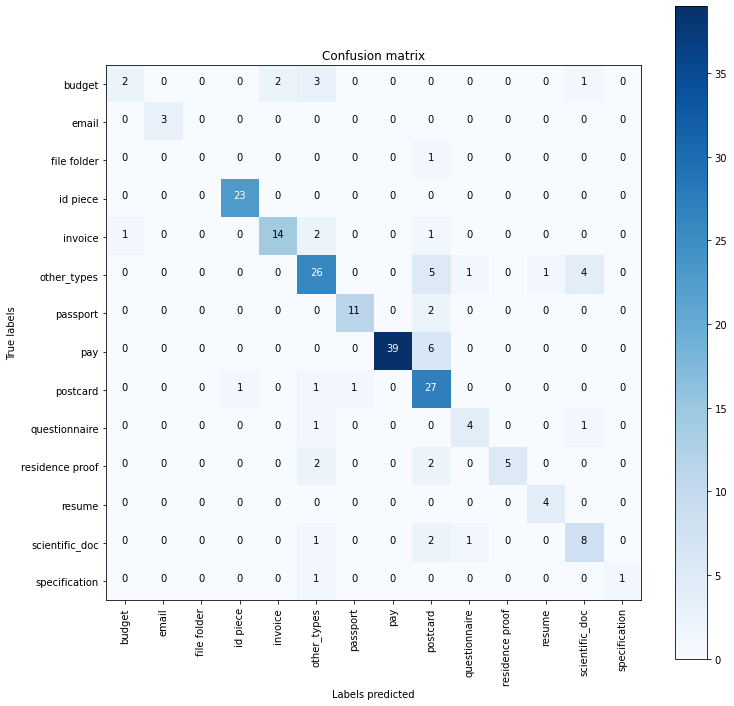

In [20]:
def confusion_matrix(y_test, y_pred,classes=[]):
    cnf_matrix = metrics.confusion_matrix(y_test, y_pred)
    if (len(classes)==0):
        extract_classes = pd.DataFrame(data = y_test.unique(), columns = ['classe']).sort_values(by = 'classe', ascending = True)
        classes = extract_classes.classe #range(0,21)

    plt.figure(figsize = (12, 12))

    plt.imshow(cnf_matrix, interpolation = 'nearest', cmap = 'Blues')
    plt.title("Confusion matrix")
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation = 90)
    plt.yticks(tick_marks, classes)

    for i, j in itertools.product(range(cnf_matrix.shape[0]), range(cnf_matrix.shape[1])):
        plt.text(j, i, cnf_matrix[i, j],
                 horizontalalignment = "center",
                 color = "white" if cnf_matrix[i, j] > ( cnf_matrix.max() / 2) else "black")

    plt.ylabel('True labels')
    plt.xlabel('Labels predicted')
    plt.show()
confusion_matrix(y_test,y_pred)

> C. CLASSIFICATION REPORT<br>


In [21]:
# Class predictions per type of document (passport, questionnaire, etc...)
def global_classification_report(y_test, y_pred,classifier="None",category="None"):    
    append = False
    if(os.path.exists('../data/classification_report.csv')):
        df = pd.read_csv('../data/classification_report.csv')
        append = True
  
    report = classification_report(y_test, y_pred, output_dict=True)
    df_report = pd.DataFrame(report).transpose().reset_index() 
    df_report['classifier'] = classifier
    df_report['category'] = category    
    
    if (append):
        df = df.drop(df[(df['classifier']==classifier) & (df['category']==category)].index)
        df = pd.concat([df, df_report])
    else:
        df = df_report
        
    df.to_csv('../data/classification_report.csv',index=False)
print(classification_report(y_test, y_pred))
    

                 precision    recall  f1-score   support

         budget       0.67      0.25      0.36         8
          email       1.00      1.00      1.00         3
    file folder       0.00      0.00      0.00         1
       id piece       0.96      1.00      0.98        23
        invoice       0.88      0.78      0.82        18
    other_types       0.70      0.70      0.70        37
       passport       0.92      0.85      0.88        13
            pay       1.00      0.87      0.93        45
       postcard       0.59      0.90      0.71        30
  questionnaire       0.67      0.67      0.67         6
residence proof       1.00      0.56      0.71         9
         resume       0.80      1.00      0.89         4
 scientific_doc       0.57      0.67      0.62        12
  specification       1.00      0.50      0.67         2

       accuracy                           0.79       211
      macro avg       0.77      0.70      0.71       211
   weighted avg       0.81   

C:\anaconda\lib\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\anaconda\lib\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\anaconda\lib\site-packages\sklearn\metrics\_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


> D. WRONG PREDICTIONS<br>

In [22]:
%%javascript
 IPython.OutputArea.prototype._should_scroll = function(lines) {
     return false;
 }

<IPython.core.display.Javascript object>

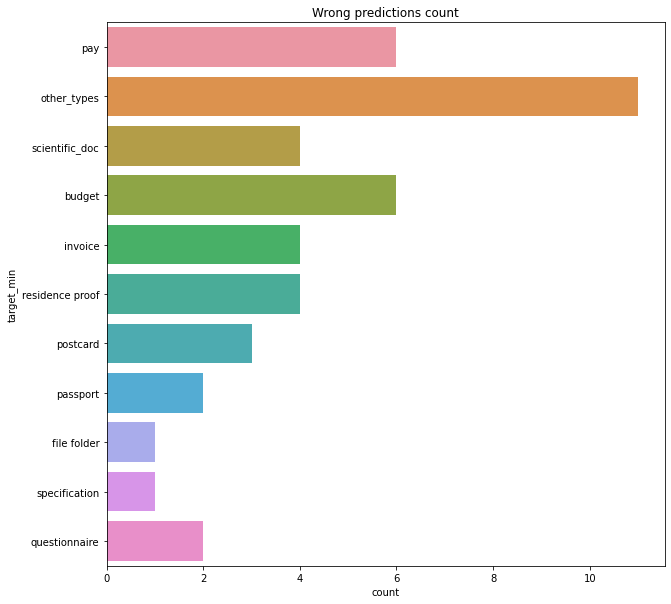

## Wrong predictions for other_types

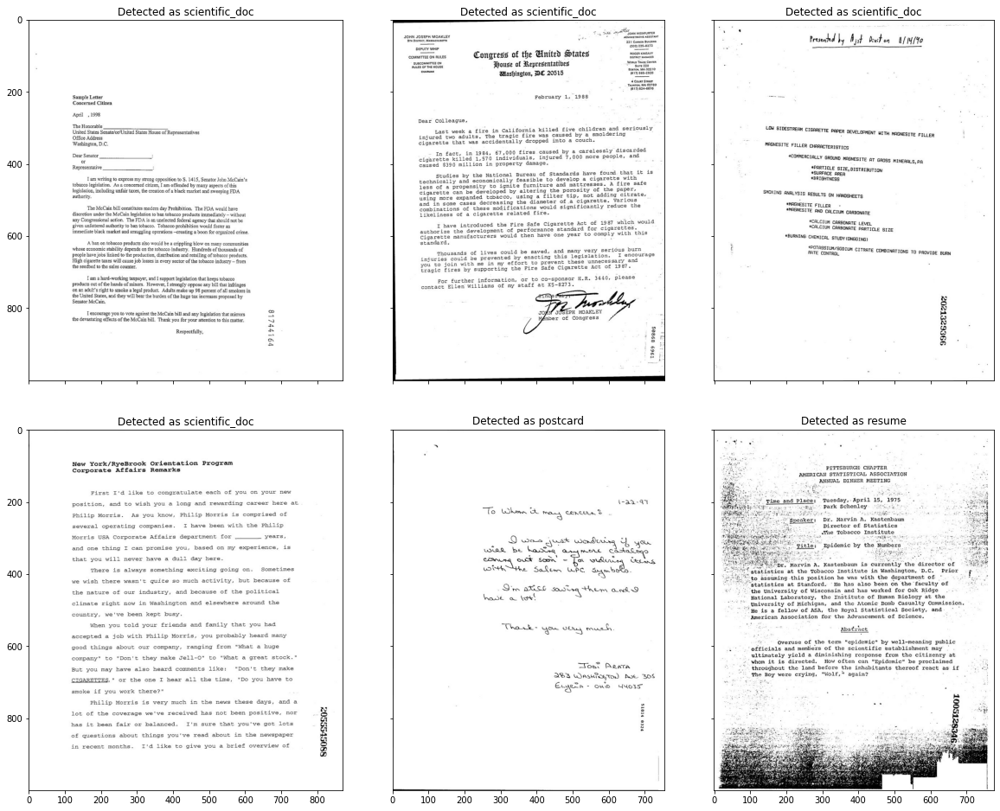

## Wrong predictions for pay

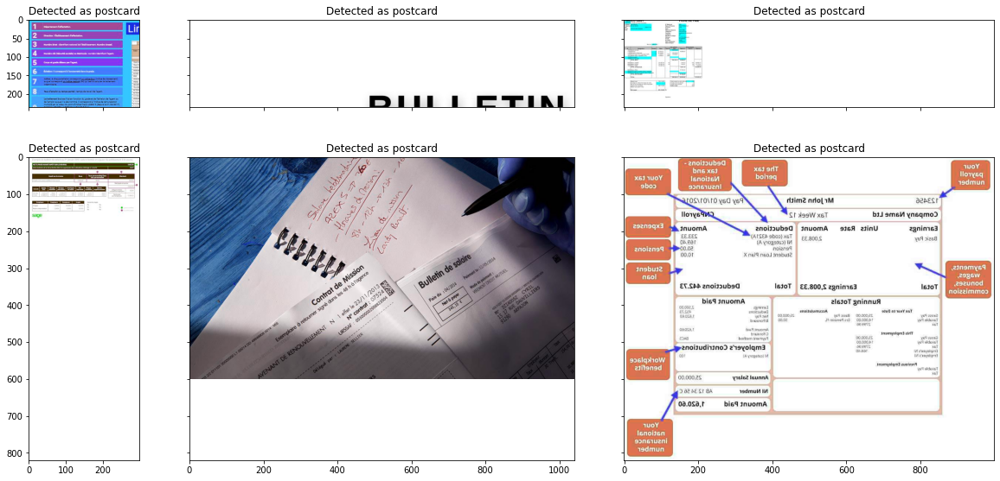

## Wrong predictions for budget

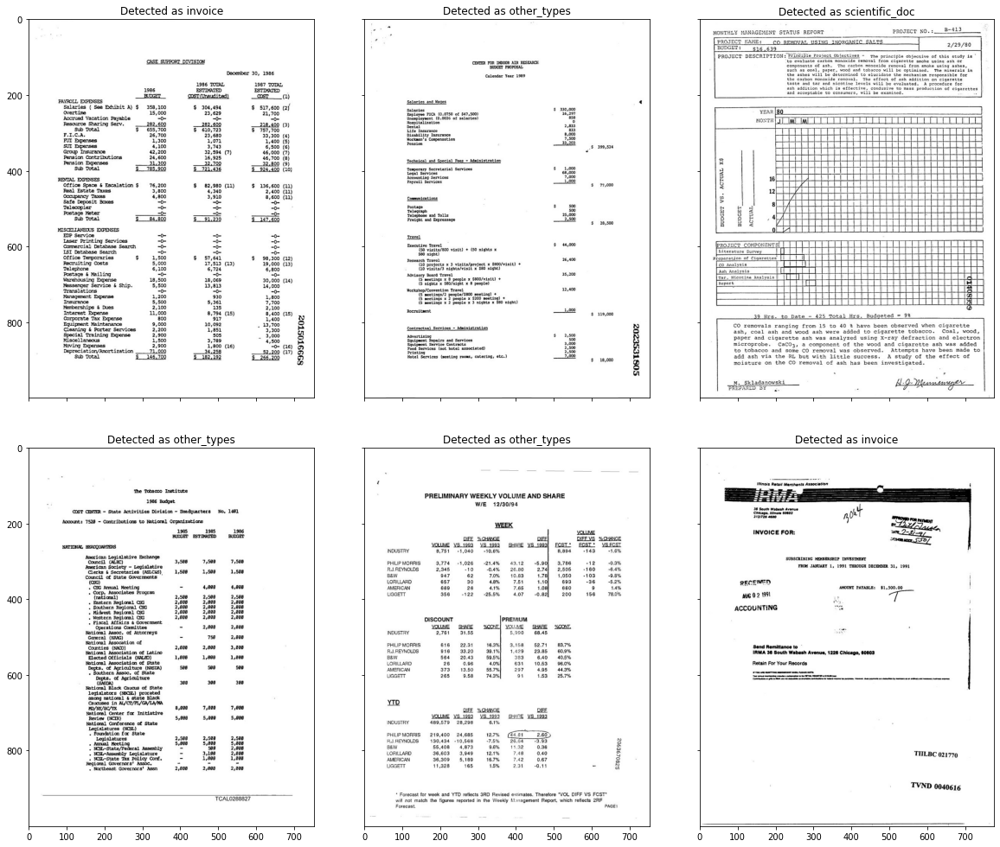

## Wrong predictions for scientific_doc

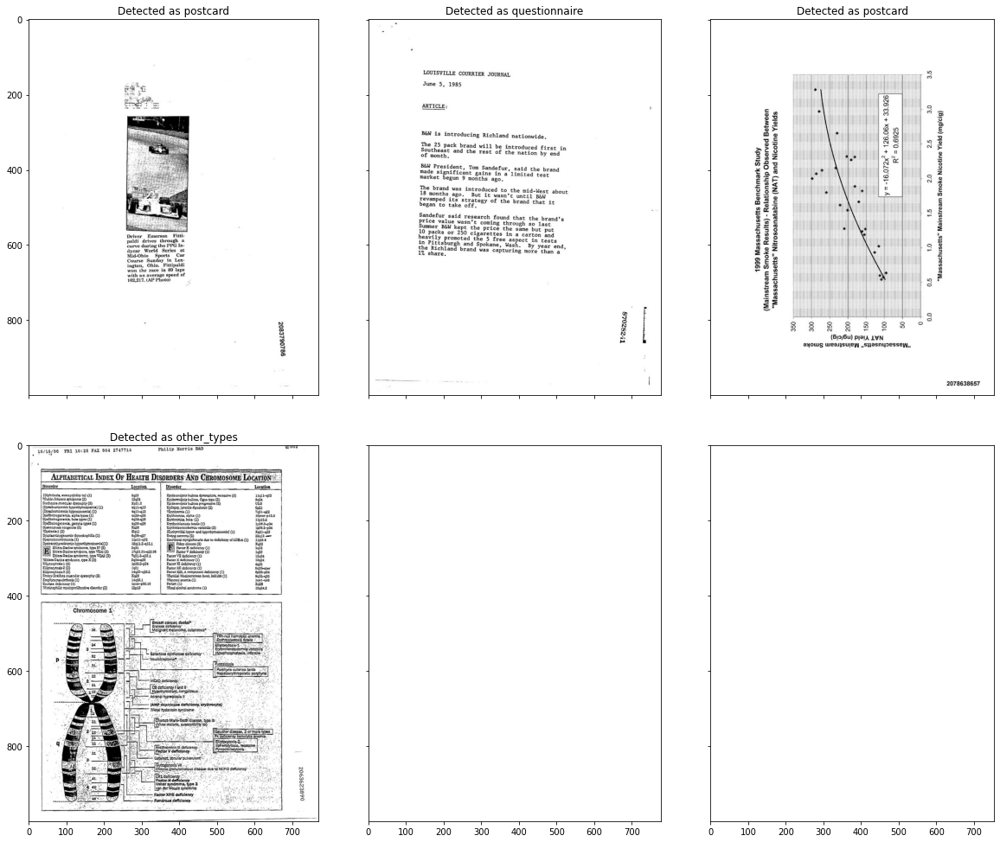

## Wrong predictions for invoice

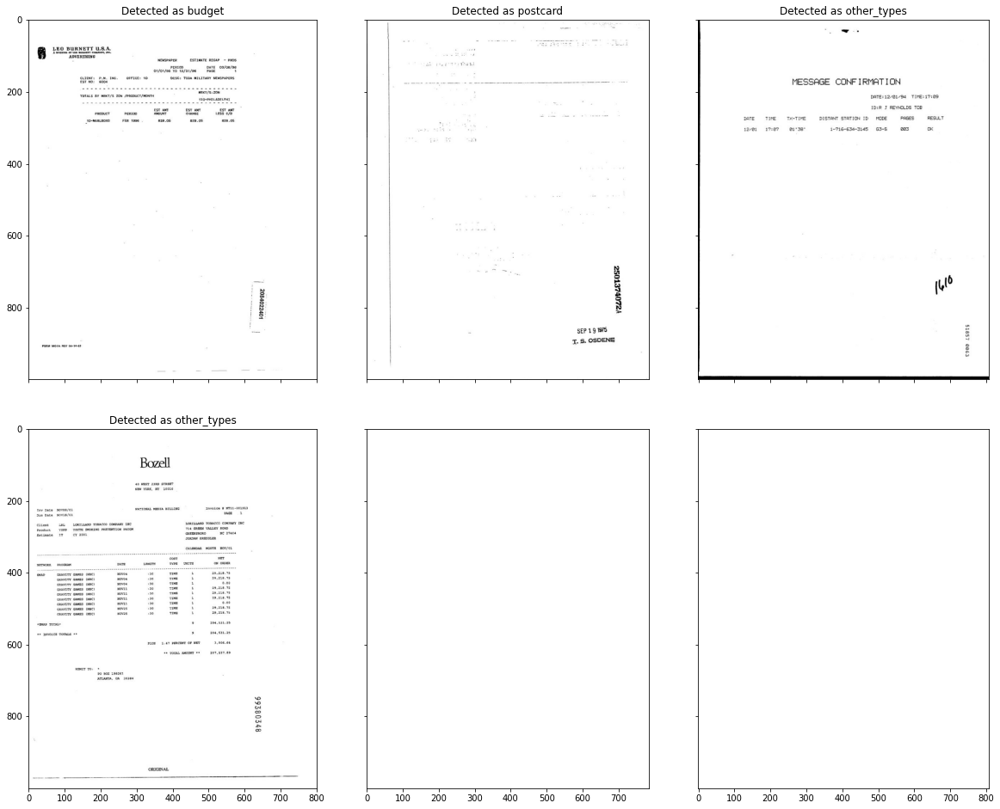

## Wrong predictions for residence proof

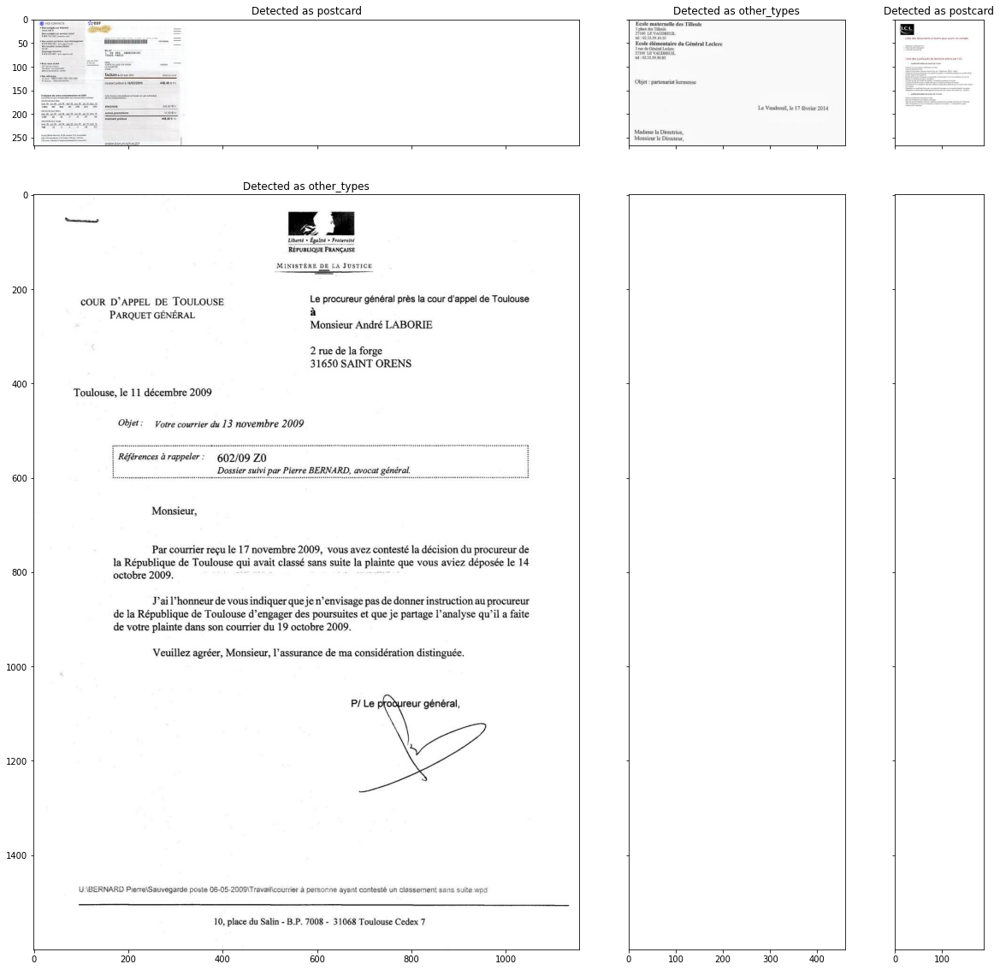

## Wrong predictions for postcard

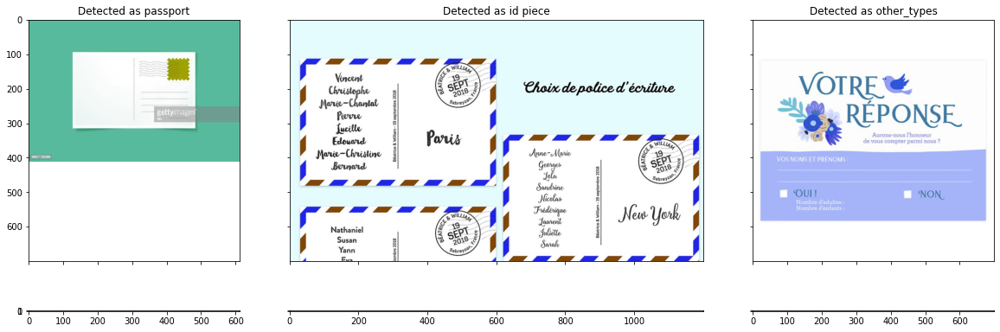

## Wrong predictions for passport

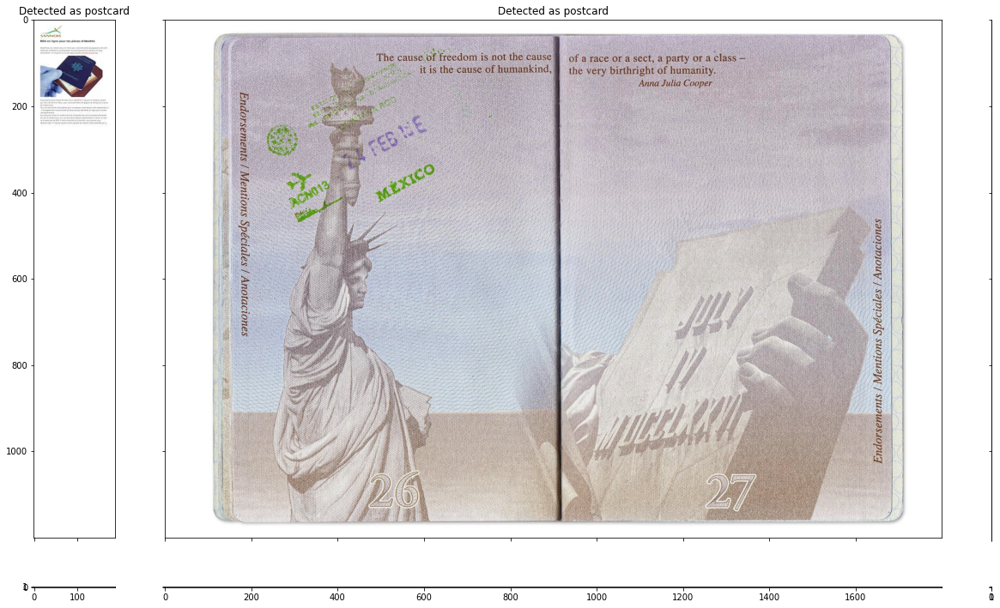

## Wrong predictions for questionnaire

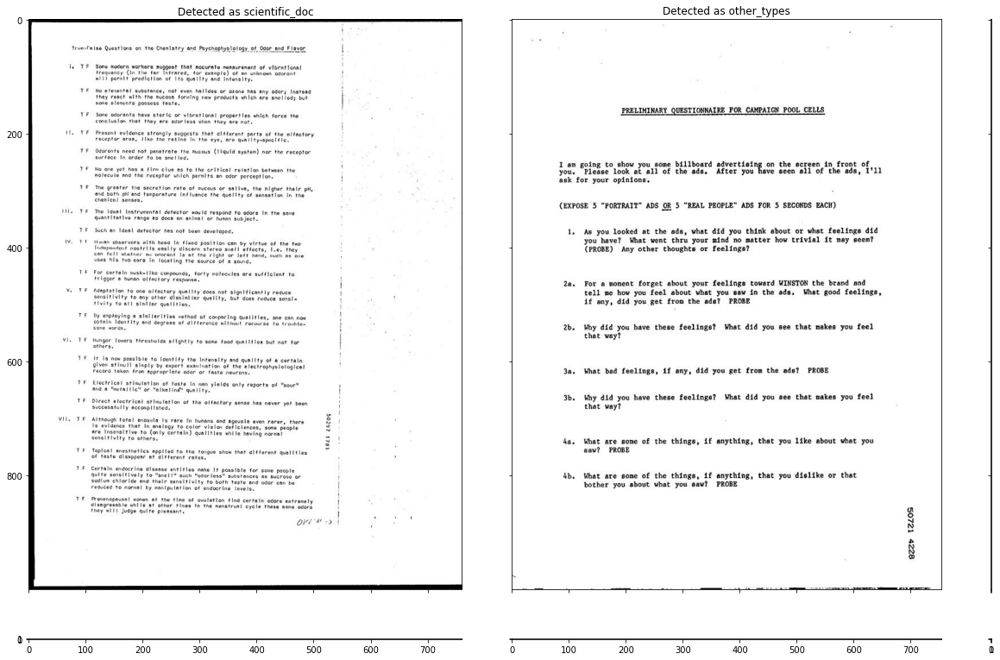

## Wrong predictions for file folder

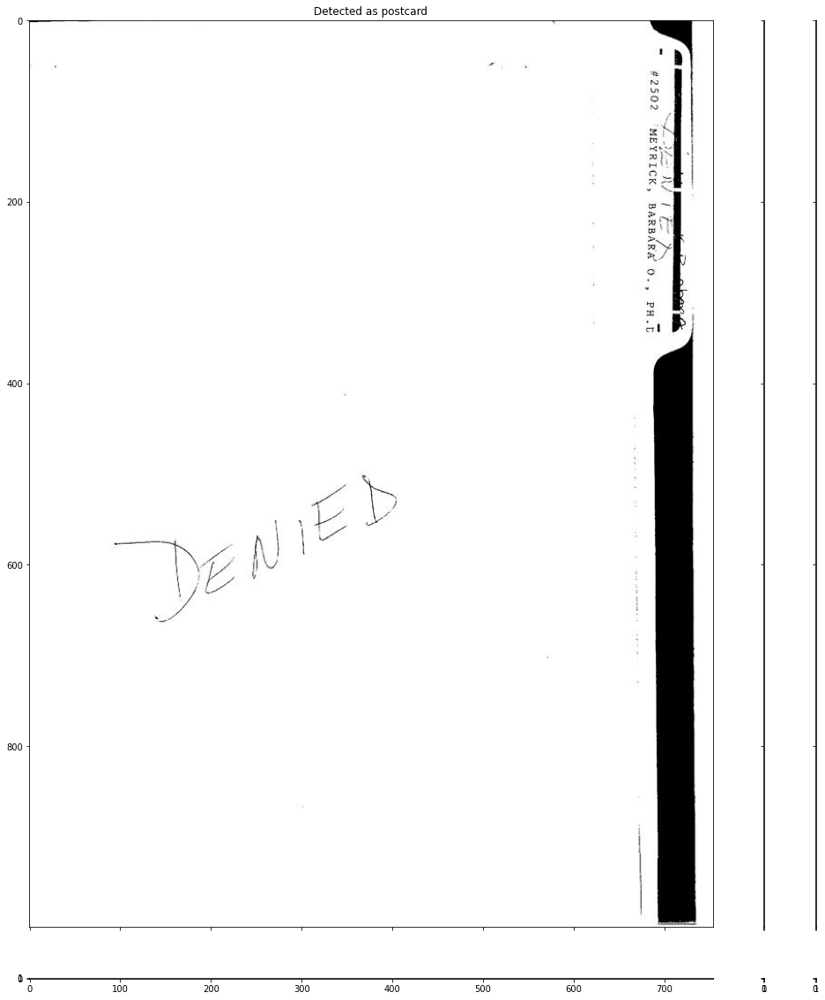

## Wrong predictions for specification

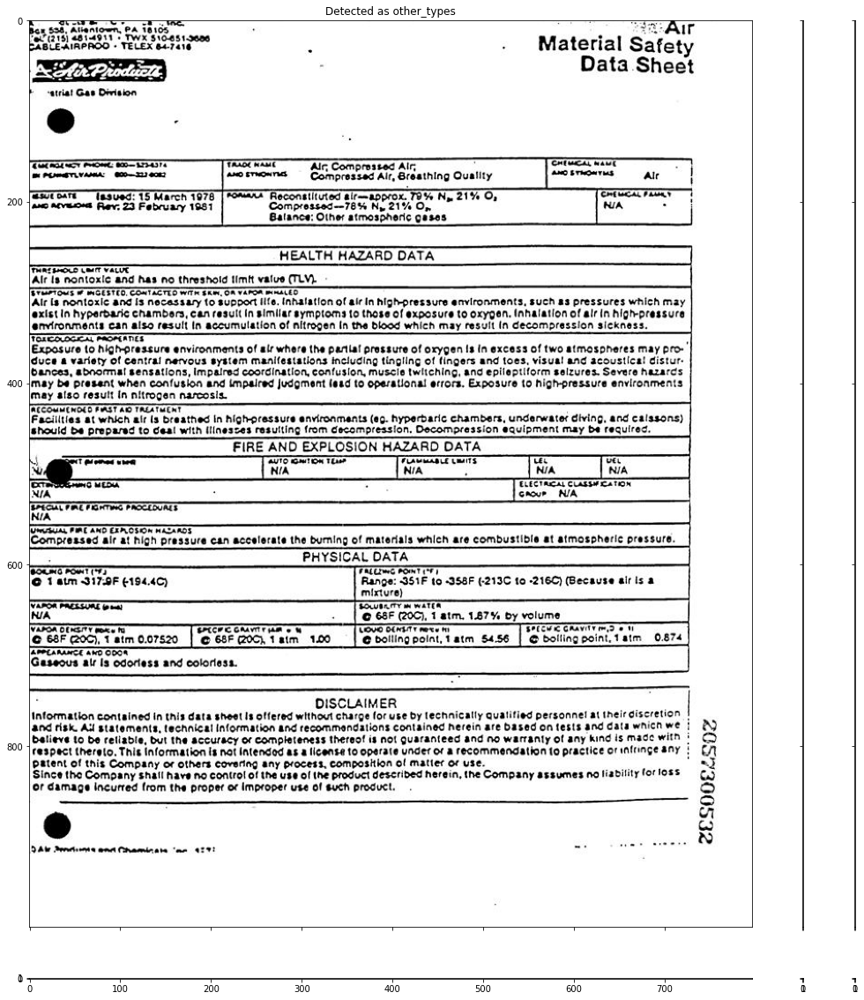

In [23]:
# Check wrong predictions per type
show_wrong_predictions(df,y_test,y_pred,X_text_test,target='target_min')

We can consider that the Logistic Regression model has a great performance with an accuracy of 76% after random oversampling.
On the other hand, we cannot consider that the model is performing well before oversampling.
The next step will be to test another machine learning models such as SVM .